In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
zipcodes = gpd.read_file('../data/zipcodes.geojson')
print(zipcodes.crs)
zipcodes.head()

EPSG:4326


,OBJECTID,ZipCode,POName,GlobalID,geometry
0,229,37115,MADISON,9492b2a0-dff5-4e2e-b77b-37c25b5c96f3,"POLYGON ((-86.68725 36.31821, -86.68722 36.318..."
1,230,37206,NASHVILLE,3a287c8d-543c-4f6e-8463-27bf9c3d8356,"POLYGON ((-86.75348 36.16274, -86.75383 36.162..."
2,231,37216,NASHVILLE,c3501fa2-5146-4881-95ac-0f36b9da82af,"POLYGON ((-86.73451 36.23774, -86.73425 36.237..."
3,232,37213,NASHVILLE,b50f3ab3-9571-4457-b059-68ef9bd0b13a,"POLYGON ((-86.77787 36.17706, -86.77810 36.176..."
4,233,37086,LA VERGNE,c3ccae22-29a2-4599-9241-72cddd64a35a,"POLYGON ((-86.58870 36.02671, -86.58837 36.026..."


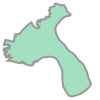

In [3]:
zipcodes.loc[0, 'geometry']

<Axes: >

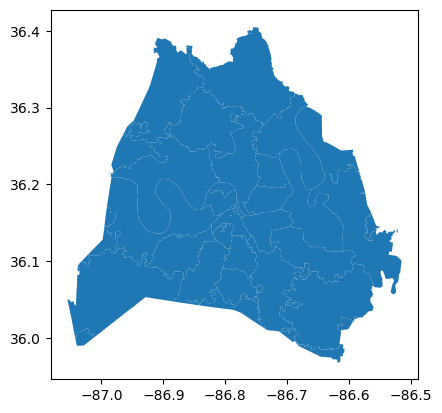

In [4]:
zipcodes.plot()

In [5]:
airbnb = pd.read_csv('../data/airbnb.csv', dtype={3: str, 17: str, 20: str, 22: str})
print(airbnb.shape)
airbnb.head(3)

(16416, 39)


,Permit #,Permit Subtype Description,Date Entered,Date Issued,Address,City,State,Subdivision Lot,Permit Type,Permit SubType,...,Contact Mobile Phone #,Contact Work Phone #,Contact Work Phone Ext,Longitude,Latitude,ObjectId,Zip Code,Parcel,x,y
0,201528689,Short Term Rental - Owner Occupied,7/8/2015 5:00:00 AM,7/8/2015 5:00:00 AM,3801 MURPHY RD,NASHVILLE,TN,"LOT 6 RICHLAND REALTY CO, SUB 328 329 & 356 W ...",CASR,CAZ10A001,...,NaN,NaN,NaN,-86.83058,36.140188,1,37209,10405014200,-9.665936e+06,4.319928e+06
1,201528745,Short Term Rental - Non-Owner Occupied,7/8/2015 5:00:00 AM,7/8/2015 5:00:00 AM,2678 MIAMI AVE,NASHVILLE,TN,PT LOT 69 & 70 WOODDALE GROVE ANNEX,CASR,CAZ10A002,...,NaN,NaN,NaN,-86.70563,36.243017,2,37214,05209017200,-9.652027e+06,4.334112e+06
2,201528747,Short Term Rental - Non-Owner Occupied,7/8/2015 5:00:00 AM,7/8/2015 5:00:00 AM,330 LAUDERDALE RD,NASHVILLE,TN,LOT 14 BLK F CHEROKEE PARK,CASR,CAZ10A002,...,NaN,NaN,NaN,-86.83466,36.135742,3,37205,10312018500,-9.666390e+06,4.319315e+06


In [6]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16416 entries, 0 to 16415
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Permit #                    16416 non-null  object 
 1   Permit Subtype Description  16416 non-null  object 
 2   Date Entered                16416 non-null  object 
 3   Date Issued                 15095 non-null  object 
 4   Address                     16416 non-null  object 
 5   City                        16415 non-null  object 
 6   State                       16415 non-null  object 
 7   Subdivision Lot             16413 non-null  object 
 8   Permit Type                 16416 non-null  object 
 9   Permit SubType              16416 non-null  object 
 10  Purpose                     16311 non-null  object 
 11  Council District            16416 non-null  int64  
 12  Census Tract                16416 non-null  int64  
 13  Expiration Date             164

In [7]:
airbnb_geo = gpd.GeoDataFrame(airbnb, crs = zipcodes.crs, geometry = gpd.points_from_xy(airbnb.Longitude, airbnb.Latitude))

In [8]:
type(airbnb_geo)

geopandas.geodataframe.GeoDataFrame

In [9]:
airbnb_geo.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [10]:
zipcodes.head(2)

,OBJECTID,ZipCode,POName,GlobalID,geometry
0,229,37115,MADISON,9492b2a0-dff5-4e2e-b77b-37c25b5c96f3,"POLYGON ((-86.68725 36.31821, -86.68722 36.318..."
1,230,37206,NASHVILLE,3a287c8d-543c-4f6e-8463-27bf9c3d8356,"POLYGON ((-86.75348 36.16274, -86.75383 36.162..."


In [11]:
airbnb_geo.head(2)

,Permit #,Permit Subtype Description,Date Entered,Date Issued,Address,City,State,Subdivision Lot,Permit Type,Permit SubType,...,Contact Work Phone #,Contact Work Phone Ext,Longitude,Latitude,ObjectId,Zip Code,Parcel,x,y,geometry
0,201528689,Short Term Rental - Owner Occupied,7/8/2015 5:00:00 AM,7/8/2015 5:00:00 AM,3801 MURPHY RD,NASHVILLE,TN,"LOT 6 RICHLAND REALTY CO, SUB 328 329 & 356 W ...",CASR,CAZ10A001,...,NaN,NaN,-86.83058,36.140188,1,37209,10405014200,-9.665936e+06,4.319928e+06,POINT (-86.83058 36.14019)
1,201528745,Short Term Rental - Non-Owner Occupied,7/8/2015 5:00:00 AM,7/8/2015 5:00:00 AM,2678 MIAMI AVE,NASHVILLE,TN,PT LOT 69 & 70 WOODDALE GROVE ANNEX,CASR,CAZ10A002,...,NaN,NaN,-86.70563,36.243017,2,37214,05209017200,-9.652027e+06,4.334112e+06,POINT (-86.70563 36.24302)


In [12]:
airbnb_geo.columns

Index(['Permit #', 'Permit Subtype Description', 'Date Entered', 'Date Issued',
       'Address', 'City', 'State', 'Subdivision Lot', 'Permit Type',
       'Permit SubType', 'Purpose', 'Council District', 'Census Tract',
       'Expiration Date', 'Permit Owner Name', 'Permit Owner Address 1',
       'Permit Owner Address 2', 'Permit Owner Address 3', 'Permit Owner City',
       'Permit Owner State', 'Permit Owner Zip Code', 'Permit Status',
       'Applicant', 'Applicant Home Phone #', 'Applicant Mobile Phone #',
       'Applicant Work Phone #', 'Applicant Work Phone Ext', 'Contact',
       'Contact Home Phone #', 'Contact Mobile Phone #',
       'Contact Work Phone #', 'Contact Work Phone Ext', 'Longitude',
       'Latitude', 'ObjectId', 'Zip Code', 'Parcel', 'x', 'y', 'geometry'],
      dtype='object')

In [13]:
airbnb_geo.drop(['Permit #', 'Permit Subtype Description', 'Date Entered', 'Date Issued',
       'City', 'State', 'Subdivision Lot', 'Permit Type',
       'Purpose', 'Council District', 'Census Tract',
       'Expiration Date', 'Permit Owner Name', 'Permit Owner Address 1',
       'Permit Owner Address 2', 'Permit Owner Address 3', 'Permit Owner City',
       'Permit Owner State', 'Permit Owner Zip Code',
       'Applicant Home Phone #', 'Applicant Mobile Phone #',
       'Applicant Work Phone #', 'Applicant Work Phone Ext', 'Contact',
       'Contact Home Phone #', 'Contact Mobile Phone #',
       'Contact Work Phone #', 'Contact Work Phone Ext', 'ObjectId', 'Parcel', 'x', 'y'], axis=1, inplace=True)

In [14]:
airbnb_geo['Permit Status'].unique()

array(['EXPIRED', 'ISSUED', 'CANCELLED', 'REVOKED', 'EXPIREEXT', 'HOLD',
       'DENIED', 'REFUNDED', 'PENDING', 'VOID'], dtype=object)

In [15]:
airbnb_geo = airbnb_geo.loc[airbnb_geo['Permit Status'] == 'ISSUED']

In [16]:
airbnbarons = airbnb_geo['Applicant'].value_counts()
airbnbarons.head(25)

Applicant
Niido Nashville, LLC                     326
SIXTH SOUTH PARTNERS, LP                 289
TBR-L VILLAGE 21 OWNER LLC                97
VIBE AT MARATHON VILLAGE, LLC             68
1212 9TH AVENUE NORTH, LLC                57
301 EIGHTH AVENUE, LLC ET AL              47
HOWELL PARK PARTNERS, LLC                 39
NASH BAMI LLC                             35
The Trio Music Row, LLC                   28
LC SOBRO I, LLC                           27
amanda rankin                             25
INFINITY LOFTS GULCH 2, LLC               25
ECG Belcourt, LLC                         25
1012 MAIN ST EN, LLC                      20
The Wanderer East, LLC                    16
Haven at Charlotte LLC                    16
2ND & HART PARTNERS LLC                   16
First Team, Llc                           15
Mcmillin Apartments, Llc                  15
MIDTOWN PLACE, LLC                        14
1221 DIVISION STREET GROUND OWNER LLC     14
23 Music Square East Partnership          13


In [17]:
airbnbarons = airbnbarons[airbnbarons >=10]
airbnbarons

Applicant
Niido Nashville, LLC                     326
SIXTH SOUTH PARTNERS, LP                 289
TBR-L VILLAGE 21 OWNER LLC                97
VIBE AT MARATHON VILLAGE, LLC             68
1212 9TH AVENUE NORTH, LLC                57
301 EIGHTH AVENUE, LLC ET AL              47
HOWELL PARK PARTNERS, LLC                 39
NASH BAMI LLC                             35
The Trio Music Row, LLC                   28
LC SOBRO I, LLC                           27
amanda rankin                             25
INFINITY LOFTS GULCH 2, LLC               25
ECG Belcourt, LLC                         25
1012 MAIN ST EN, LLC                      20
The Wanderer East, LLC                    16
Haven at Charlotte LLC                    16
2ND & HART PARTNERS LLC                   16
First Team, Llc                           15
Mcmillin Apartments, Llc                  15
MIDTOWN PLACE, LLC                        14
1221 DIVISION STREET GROUND OWNER LLC     14
23 Music Square East Partnership          13


In [18]:
zipcodes = zipcodes [['ZipCode', 'POName', 'geometry']]

In [19]:
airbnb_by_zip = gpd.sjoin(airbnb_geo, zipcodes, predicate = 'within')

In [20]:
airbnb_by_zip.head()

,Address,Permit SubType,Permit Status,Applicant,Longitude,Latitude,Zip Code,geometry,index_right,ZipCode,POName
1,2678 MIAMI AVE,CAZ10A002,ISSUED,"Page, Gregory A.",-86.705630,36.243017,37214,POINT (-86.70563 36.24302),5,37214,NASHVILLE
2,330 LAUDERDALE RD,CAZ10A002,ISSUED,"Page, Greg",-86.834660,36.135742,37205,POINT (-86.83466 36.13574),15,37205,NASHVILLE
3,1210 ASHWOOD AVE,CAZ10A002,ISSUED,Aerial Development,-86.789964,36.129027,37212,POINT (-86.78996 36.12903),53,37212,NASHVILLE
5,6019 ROBERTSON AVE,CAZ10A002,ISSUED,"Bender, Jacob L.",-86.867827,36.156681,37209,POINT (-86.86783 36.15668),9,37209,NASHVILLE
6,1705 RIDLEY BLVD,CAZ10A002,ISSUED,"Woodland, Alphonso",-86.776441,36.136679,37203,POINT (-86.77644 36.13668),32,37203,NASHVILLE


In [21]:
airbnb_by_zip['ZipCode'].value_counts()

ZipCode
37203    1834
37208     731
37206     716
37207     706
37212     619
37209     484
37210     446
37201     365
37216     329
37211     203
37204     192
37214     185
37217     129
37218     115
37115     103
37219      75
37205      48
37076      45
37138      36
37013      29
37215      26
37221      21
37189      21
37228      17
37072      16
37220      11
37080       9
37143       3
37027       2
37064       1
37213       1
Name: count, dtype: int64

In [22]:
airbnb_in_37203 = airbnb_by_zip.loc[airbnb_by_zip['ZipCode'] == '37203']
airbnb_in_37203.shape

(1834, 11)

In [23]:
polygon37203 = zipcodes.loc[zipcodes['ZipCode'] == '37203']
polygon37203.shape

(1, 3)

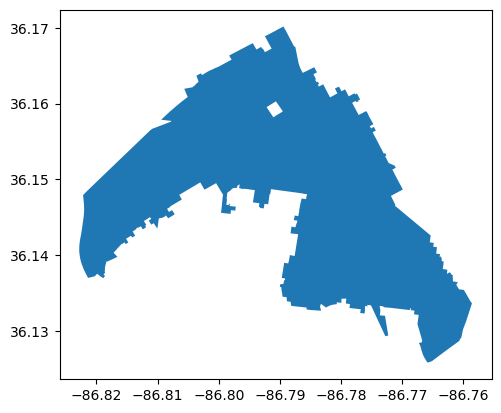

In [24]:
polygon37203.plot();

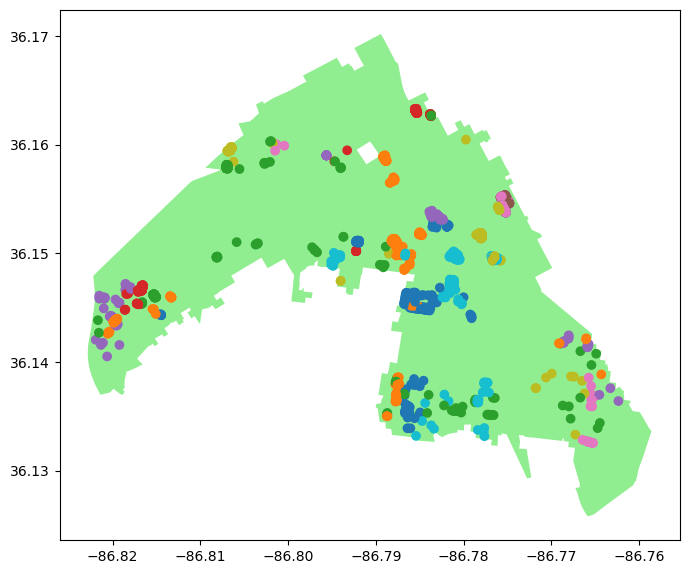

In [25]:
ax = polygon37203.plot(figsize = (8, 10), color = 'lightgreen')
airbnb_in_37203.plot( ax = ax, column = 'Address');
plt.show()

In [26]:
polygon37203.centroid

C:\Users\noahf\AppData\Local\Temp\ipykernel_8596\951576108.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  polygon37203.centroid


32    POINT (-86.78898 36.14857)
dtype: geometry

In [27]:
center = polygon37203.geometry.centroid[32]
print(center)

POINT (-86.78898421845274 36.14857447700962)


C:\Users\noahf\AppData\Local\Temp\ipykernel_8596\2496014448.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = polygon37203.geometry.centroid[32]


In [28]:
area_center = [center.y, center.x]
print(area_center)

[36.14857447700962, -86.78898421845274]


In [29]:
map_37203 = folium.Map(location = area_center, zoom_start = 12)
map_37203

In [30]:
i = 0
for row_index, row_values in airbnb_in_37203.iterrows():
    if i <3:
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 6
values are:
 
Address                           1705 RIDLEY BLVD
Permit SubType                           CAZ10A002
Permit Status                               ISSUED
Applicant                       Woodland, Alphonso
Longitude                               -86.776441
Latitude                                 36.136679
Zip Code                                     37203
geometry          POINT (-86.77644051 36.13667934)
index_right                                     32
ZipCode                                      37203
POName                                   NASHVILLE
Name: 6, dtype: object
------------------------- 
index is 135
values are:
 
Address                          1018 C ARGYLE AVE
Permit SubType                           CAZ10A003
Permit Status                               ISSUED
Applicant                            Duker, Deidre
Longitude                               -86.785603
Latitude                                 36.137869
Zip Code                       

Highest density of short term rentals in Nashville.

In [32]:
#A cluster map of 37207 - the highest density of short term rentals in Nashville
cluster_map_37203 = folium.Map(location =  area_center, zoom_start = 12)

marker_cluster = MarkerCluster().add_to(cluster_map_37203)

folium.GeoJson(polygon37203).add_to(cluster_map_37203)

for row_index, row_values in airbnb_in_37203.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Address'])
    icon=folium.Icon(color="blue",icon="house", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)

cluster_map_37203.save('../data/cluster37203.html')

cluster_map_37203

In [33]:
all_zips = zipcodes
all_zips

,ZipCode,POName,geometry
0,37115,MADISON,"POLYGON ((-86.68725 36.31821, -86.68722 36.318..."
1,37206,NASHVILLE,"POLYGON ((-86.75348 36.16274, -86.75383 36.162..."
2,37216,NASHVILLE,"POLYGON ((-86.73451 36.23774, -86.73425 36.237..."
3,37213,NASHVILLE,"POLYGON ((-86.77787 36.17706, -86.77810 36.176..."
4,37086,LA VERGNE,"POLYGON ((-86.58870 36.02671, -86.58837 36.026..."
5,37214,NASHVILLE,"POLYGON ((-86.65585 36.11824, -86.66410 36.119..."
6,37135,NOLENSVILLE,"POLYGON ((-86.67188 35.98955, -86.67189 35.989..."
7,37220,NASHVILLE,"POLYGON ((-86.76043 36.08004, -86.76043 36.080..."
8,37204,NASHVILLE,"POLYGON ((-86.77914 36.13424, -86.77923 36.133..."
9,37209,NASHVILLE,"POLYGON ((-86.97543 36.20877, -86.97221 36.208..."


<Axes: >

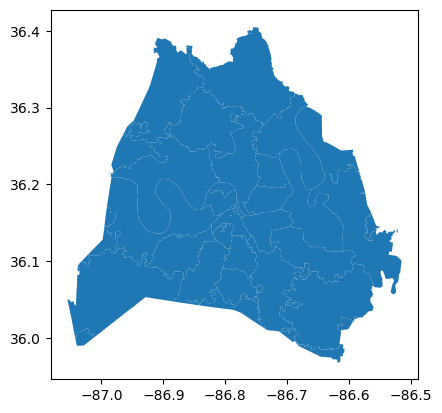

In [34]:
all_zips.plot()

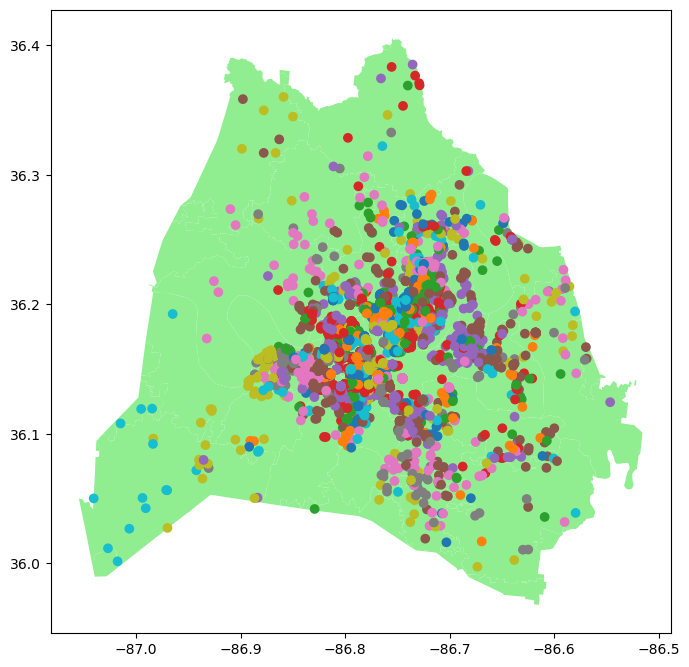

In [35]:
ax = all_zips.plot(figsize = (8, 10), color = 'lightgreen')
airbnb_by_zip.plot( ax = ax, column = 'Address');
plt.show()

In [36]:
all_zips.centroid

C:\Users\noahf\AppData\Local\Temp\ipykernel_1260\1591445237.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  all_zips.centroid


0     POINT (-86.69477 36.25433)
1     POINT (-86.73098 36.18090)
2     POINT (-86.72635 36.21605)
3     POINT (-86.76851 36.16713)
4     POINT (-86.60543 36.01826)
5     POINT (-86.66271 36.16744)
6     POINT (-86.63653 35.98113)
7     POINT (-86.78161 36.06685)
8     POINT (-86.77467 36.10566)
9     POINT (-86.91816 36.15605)
10    POINT (-86.78551 36.04148)
11    POINT (-86.73347 36.14429)
12    POINT (-86.80400 36.19479)
13    POINT (-86.77702 36.16557)
14    POINT (-86.78317 36.16682)
15    POINT (-86.87327 36.11084)
16    POINT (-86.97531 36.06283)
17    POINT (-87.02866 36.00026)
18    POINT (-86.75978 36.39850)
19    POINT (-86.94712 36.24580)
20    POINT (-86.89242 36.27139)
21    POINT (-87.03606 36.09576)
22    POINT (-87.03712 36.08997)
23    POINT (-86.99584 36.11958)
24    POINT (-86.98674 36.15655)
25    POINT (-86.68156 35.99059)
26    POINT (-86.68331 35.99201)
27    POINT (-86.68513 35.99434)
28    POINT (-86.72570 36.00942)
29    POINT (-86.69470 36.00387)
30    POIN

In [37]:
center = all_zips.geometry.centroid[12]
print(center)

POINT (-86.80400295708932 36.194791074749254)


C:\Users\noahf\AppData\Local\Temp\ipykernel_1260\2332084742.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = all_zips.geometry.centroid[12]


In [38]:
zips_center = [center.y, center.x]
print(zips_center)

[36.194791074749254, -86.80400295708932]


In [39]:
map_all_zips = folium.Map(location = zips_center, zoom_start = 12)
map_all_zips

In [40]:
i = 0
for row_index, row_values in airbnb_in_37203.iterrows():
    if i <3:
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 6
values are:
 
Address                           1705 RIDLEY BLVD
Permit SubType                           CAZ10A002
Permit Status                               ISSUED
Applicant                       Woodland, Alphonso
Longitude                               -86.776441
Latitude                                 36.136679
Zip Code                                     37203
geometry          POINT (-86.77644051 36.13667934)
index_right                                     32
ZipCode                                      37203
POName                                   NASHVILLE
Name: 6, dtype: object
------------------------- 
index is 135
values are:
 
Address                          1018 C ARGYLE AVE
Permit SubType                           CAZ10A003
Permit Status                               ISSUED
Applicant                            Duker, Deidre
Longitude                               -86.785603
Latitude                                 36.137869
Zip Code                       

Complete Map of Active permit listings of short term rentals for Nashville.

In [42]:
cluster_map_nashville = folium.Map(location =  zips_center, zoom_start = 12)

marker_cluster_nashville = MarkerCluster().add_to(cluster_map_nashville)

folium.GeoJson(all_zips).add_to(cluster_map_nashville)

folium.GeoJson(
    all_zips,
    style_function=lambda x: {
        "fillColor": "blue",
        "color": "black",
        "weight": 2,
        "fillOpacity": 0.1,
    },
    tooltip=folium.GeoJsonTooltip(fields=["ZipCode"]),
).add_to(cluster_map_nashville)



for row_index, row_values in airbnb_by_zip.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Address'])
    icon=folium.Icon(color="blue",icon="house", prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster_nashville)

from folium.plugins import Fullscreen
fullscreen = Fullscreen(position="topright")
cluster_map_nashville.add_child(fullscreen)

cluster_map_nashville.save('../data/clusternashville.html')

cluster_map_nashville